# **Seasonal Precipitation Anomaly Gridded Maps**

# Importing Libraries and Functions

In [1]:
import xarray as xr
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import numpy as np
import cartopy.feature as cfeature
from os import listdir

In [2]:
def season_mean(ds, calendar="standard"):
    # Make a DataArray with the number of days in each month, size = len(time)
    month_length = ds.time.dt.days_in_month

    # Calculate the weights by grouping by 'time.season'
    weights = (
        month_length.groupby("time.season") / month_length.groupby("time.season").sum()
    )

    # Test that the sum of the weights for each season is 1.0
    np.testing.assert_allclose(weights.groupby("time.season").sum().values, np.ones(4))

    # Calculate the weighted average
    return (ds * weights).groupby("time.season").sum(dim="time")

In [3]:
from dask.distributed import Client, LocalCluster

cluster = LocalCluster(n_workers=40, memory_limit="20GB", threads_per_worker=1, processes=True, dashboard_address=":8071")
client = Client(cluster)
client

Connection method: Cluster object,Cluster type: distributed.LocalCluster
Dashboard: http://127.0.0.1:8071/status,
Dashboard: http://127.0.0.1:8071/status,Workers: 40
Total threads: 40,Total memory: 745.06 GiB
Status: running,Using processes: True
Comm: tcp://127.0.0.1:42441,Workers: 0
Dashboard: http://127.0.0.1:8071/status,Total threads: 0
Started: Just now,Total memory: 0 B
Comm: tcp://127.0.0.1:35399,Total threads: 1
Dashboard: http://127.0.0.1:38429/status,Memory: 18.63 GiB
Nanny: tcp://127.0.0.1:35329,


# Historical Seasonal Precipitation All Models

In [4]:
spear_historical_pr = xr.open_zarr('/home/persad_research/SIMULATION_DATA/ZARR/RAMIP/SIM_VARIABLES/SPEAR_historical_day_pr.zarr')
noresm2_historical_pr = xr.open_zarr('/home/persad_research/SIMULATION_DATA/ZARR/RAMIP/SIM_VARIABLES/NorESM2-LM_historical_day_pr.zarr')
mri_historical_pr = xr.open_zarr('/home/persad_research/SIMULATION_DATA/ZARR/RAMIP/SIM_VARIABLES/MRI-ESM2-0_historical_day_pr.zarr')
cesm2_historical_pr = xr.open_zarr('/home/persad_research/SIMULATION_DATA/ZARR/RAMIP/SIM_VARIABLES/CESM2_historical_day_pr.zarr')


ensemble_members = []
existing_members = [1]
for i in existing_members:
    directory = f'/home/persad_research/SIMULATION_DATA/DATA/RAMIP/CanESM5-1/historical/r{i}i1p1f1/atm/day/pr/'
    paths = sorted([directory + f for f in listdir(directory) if '.nc' in f])
    pr = xr.open_mfdataset(paths, chunks={'time': -1, 'lat': 16, 'lon': 32})['pr']
    ensemble_members.append(pr)
canesm5_historical_pr = xr.concat(ensemble_members, dim='member')
canesm5_historical_pr = canesm5_historical_pr.assign_coords(member=[f'r{i}i1p1f1' for i in existing_members])

ensemble_members = []
existing_members = [1, 3, 4]
for i in existing_members:
    directory = f'/home/persad_research/SIMULATION_DATA/DATA/RAMIP/EC-Earth3-AerChem/historical/r{i}i1p1f1/atm/day/pr/'
    paths = sorted([directory + f for f in listdir(directory) if '.nc' in f])
    pr = xr.open_mfdataset(paths, chunks={'time': -1, 'lat': 64, 'lon': 128})['pr']
    ensemble_members.append(pr)
ec_historical_pr = xr.concat(ensemble_members, dim='member')
ec_historical_pr= ec_historical_pr.assign_coords(member=[f'r{i}i1p1f1' for i in existing_members])

/tmp/ipykernel_193571/1867727855.py:12: UserWarning: The specified chunks separate the stored chunks along dimension "lat" starting at index 16. This could degrade performance. Instead, consider rechunking after loading.
  pr = xr.open_mfdataset(paths, chunks={'time': -1, 'lat': 16, 'lon': 32})['pr']
/tmp/ipykernel_193571/1867727855.py:12: UserWarning: The specified chunks separate the stored chunks along dimension "lon" starting at index 32. This could degrade performance. Instead, consider rechunking after loading.
  pr = xr.open_mfdataset(paths, chunks={'time': -1, 'lat': 16, 'lon': 32})['pr']
/tmp/ipykernel_193571/1867727855.py:22: UserWarning: The specified chunks separate the stored chunks along dimension "lat" starting at index 64. This could degrade performance. Instead, consider rechunking after loading.
  pr = xr.open_mfdataset(paths, chunks={'time': -1, 'lat': 64, 'lon': 128})['pr']
/tmp/ipykernel_193571/1867727855.py:22: UserWarning: The specified chunks separate the stored

In [5]:
# Select years
spear_historical_pr = spear_historical_pr.sel(time=slice('1961-01-01', '1990-12-31'))
noresm2_historical_pr = noresm2_historical_pr.sel(time=slice('1961-01-01', '1990-12-31'))
mri_historical_pr = mri_historical_pr.sel(time=slice('1961-01-01', '1990-12-31'))
cesm2_historical_pr = cesm2_historical_pr.sel(time=slice('1961-01-01', '1990-12-31'))
canesm5_historical_pr = canesm5_historical_pr.sel(time=slice('1961-01-01', '1990-12-31'))
ec_historical_pr = ec_historical_pr.sel(time=slice('1961-01-01', '1990-12-31'))

In [6]:
# Unit Conversions
spear_historical_pr_mm_day = spear_historical_pr['pr'] * 86400
noresm2_historical_pr_mm_day = noresm2_historical_pr['pr'] * 86400
mri_historical_pr_mm_day = mri_historical_pr['pr'] * 86400
cesm2_historical_pr_mm_day = cesm2_historical_pr['pr'] * 86400
canesm5_historical_pr_mm_day = canesm5_historical_pr * 86400
ec_historical_pr_mm_day = ec_historical_pr * 86400

In [7]:
# Taking seasonal mean FIRST, then ensemble mean
spear_historical_seasonal_member = season_mean(spear_historical_pr_mm_day)
spear_historical_seasonal = spear_historical_seasonal_member.mean('member')

noresm2_historical_seasonal_member = season_mean(noresm2_historical_pr_mm_day)
noresm2_historical_seasonal = noresm2_historical_seasonal_member.mean('member')

mri_historical_seasonal_member = season_mean(mri_historical_pr_mm_day)
mri_historical_seasonal = mri_historical_seasonal_member.mean('member')

cesm2_historical_seasonal_member = season_mean(cesm2_historical_pr_mm_day)
cesm2_historical_seasonal = cesm2_historical_seasonal_member.mean('member')

canesm5_historical_seasonal_member = season_mean(canesm5_historical_pr_mm_day)
canesm5_historical_seasonal = canesm5_historical_seasonal_member.mean('member')

ec_historical_seasonal_member = season_mean(ec_historical_pr_mm_day)
ec_historical_seasonal = ec_historical_seasonal_member.mean('member')

In [8]:
# Saving to memory
spear_historical_seasonal = spear_historical_seasonal.compute()
noresm2_historical_seasonal = noresm2_historical_seasonal.compute()
mri_historical_seasonal = mri_historical_seasonal.compute()
cesm2_historical_seasonal = cesm2_historical_seasonal.compute()
canesm5_historical_seasonal = canesm5_historical_seasonal.compute()
ec_historical_seasonal = ec_historical_seasonal.compute()

In [9]:
# Annual means
spear_historical_pr_mm_day = spear_historical_pr_mm_day.mean('member').mean('time').compute()
noresm2_historical_pr_mm_day = noresm2_historical_pr_mm_day.mean('member').mean('time').compute()
mri_historical_pr_mm_day = mri_historical_pr_mm_day.mean('member').mean('time').compute()
cesm2_historical_pr_mm_day = cesm2_historical_pr_mm_day.mean('member').mean('time').compute()
canesm5_historical_pr_mm_day = canesm5_historical_pr_mm_day.mean('member').mean('time').compute()
ec_historical_pr_mm_day = ec_historical_pr_mm_day.mean('member').mean('time').compute()

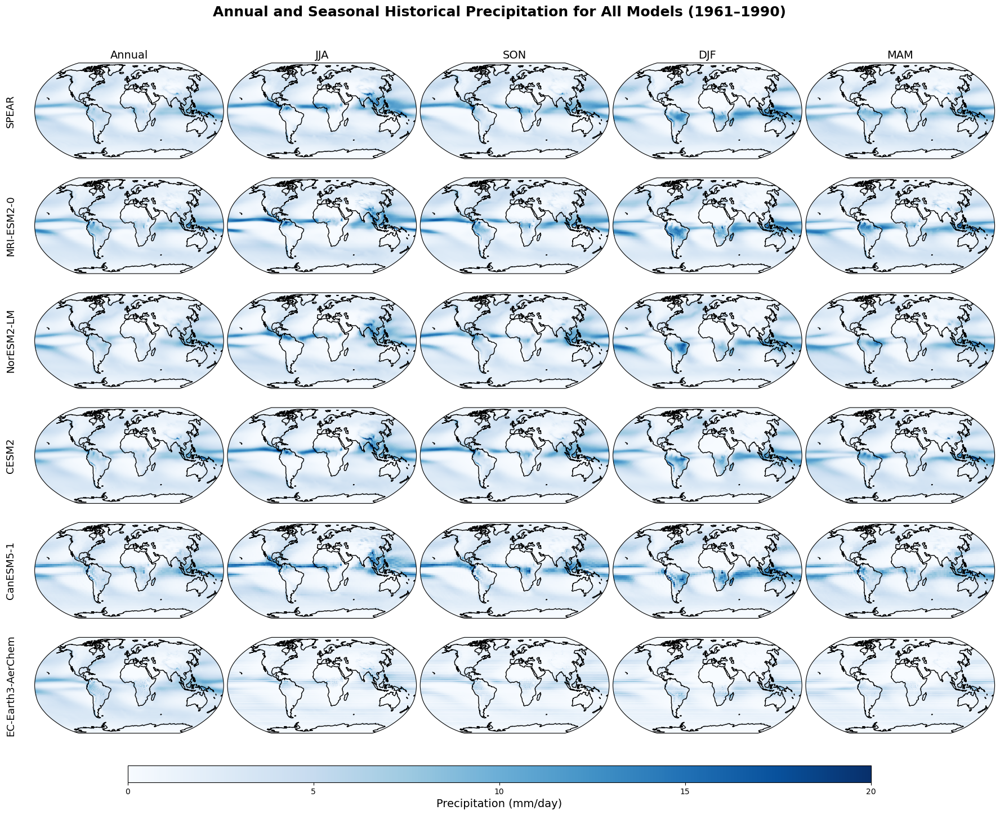

In [10]:
# Plotting
seasonal_means = {
    "SPEAR":            spear_historical_seasonal,
    "MRI-ESM2-0":       mri_historical_seasonal,
    "NorESM2-LM":       noresm2_historical_seasonal,
    "CESM2":            cesm2_historical_seasonal,
    "CanESM5-1":        canesm5_historical_seasonal,
    "EC-Earth3-AerChem": ec_historical_seasonal
}

annual_means = {
    "SPEAR":            spear_historical_pr_mm_day,
    "MRI-ESM2-0":       mri_historical_pr_mm_day,
    "NorESM2-LM":       noresm2_historical_pr_mm_day,
    "CESM2":            cesm2_historical_pr_mm_day,
    "CanESM5-1":        canesm5_historical_pr_mm_day,
    "EC-Earth3-AerChem": ec_historical_pr_mm_day
}

models  = list(seasonal_means.keys())
seasons = ["JJA", "SON", "DJF", "MAM"]
vmin = 0
vmax = 20
cbar_ticks = np.arange(0, 25, 5)

fig, axes = plt.subplots(
    nrows=len(models),
    ncols=len(seasons) + 1,
    figsize=(22, 15),
    subplot_kw={"projection": ccrs.Robinson()}
)

for i, model in enumerate(models):
    for j in range(len(seasons) + 1):

        ax = axes[i, j]
        ax.set_global()
        ax.coastlines()

        if j == 0:
            # Annual precipitation
            data = annual_means[model]
        else:
            # Seasonal columns
            season = seasons[j - 1]
            data = seasonal_means[model].sel(season=season)

        im = data.plot(
            ax=ax,
            transform=ccrs.PlateCarree(),
            cmap="Blues",
            vmin=vmin, vmax=vmax,
            add_colorbar=False,
            add_labels=False
        )

        if i == 0:
            if j == 0:
                ax.set_title("Annual", fontsize=14)
            else:
                ax.set_title(seasons[j - 1], fontsize=14)

        if j == 0:
            ax.text(-0.10, 0.5, model, fontsize=13,
                    rotation=90, ha="right", va="center",
                    transform=ax.transAxes)

# Shared colorbar
cbar_ax = fig.add_axes([0.20, 0.06, 0.60, 0.02])  # adjust if needed
cbar = fig.colorbar(im, cax=cbar_ax, orientation="horizontal")
cbar.set_label("Precipitation (mm/day)", fontsize=14)
cbar.set_ticks(cbar_ticks)

fig.suptitle(
    "Annual and Seasonal Historical Precipitation for All Models (1961–1990)",
    fontsize=18, fontweight="bold", y=0.98
)

fig.subplots_adjust(top=0.92, wspace=0.02, hspace=0.05)

plt.savefig("seasonal_annual_precip.png", dpi=300, bbox_inches="tight")
plt.show()


# SSP370 Seasonal Anomalies All Models

In [ ]:
model_names = ['SPEAR', 'NorESM2-LM', 'MRI-ESM2-0', 'CESM2', 'CanESM5-1', 'EC-Earth3-AerChem']

data_paths = {
    'SPEAR': '/home/persad_research/SIMULATION_DATA/ZARR/RAMIP/SIM_VARIABLES/SPEAR_ssp370_day_pr.zarr',
    'NorESM2-LM': '/home/persad_research/SIMULATION_DATA/ZARR/RAMIP/SIM_VARIABLES/NorESM2-LM_ssp370_day_pr.zarr',
    'MRI-ESM2-0': '/home/persad_research/SIMULATION_DATA/ZARR/RAMIP/SIM_VARIABLES/MRI-ESM2-0_ssp370_day_pr.zarr',
    'CESM2': '/home/persad_research/SIMULATION_DATA/ZARR/RAMIP/SIM_VARIABLES/CESM2_ssp370_day_pr.zarr',
    'CanESM5-1': '/home/persad_research/SIMULATION_DATA/ZARR/RAMIP/SIM_VARIABLES/CanESM5-1_ssp370_day_pr.zarr',
    'EC-Earth3-AerChem': '/home/persad_research/SIMULATION_DATA/ZARR/RAMIP/SIM_VARIABLES/EC-Earth3-AerChem_ssp370_day_pr.zarr'
}

def process_model_pr_seasonal_and_annual(zarr_path, start_year=2041, end_year=2050):
    ds = xr.open_zarr(zarr_path)
    ds_sliced = ds.sel(time=slice(f'{start_year}-01-01', f'{end_year}-12-31'))

    pr = ds_sliced['pr'] * 86400
    #seasonal
    pr_seasonal_member = season_mean(pr)
    pr_seasonal = pr_seasonal_member.mean(dim='member')  

    #annual 
    pr_annual = pr.mean(dim=('time', 'member'))

    return pr_seasonal.compute(), pr_annual.compute()

processed_seasonal_ssp370 = {}
processed_annual_ssp370   = {}

for model_name in model_names:
    print(f"Processing {model_name}...")
    pr_seasonal, pr_annual = process_model_pr_seasonal_and_annual(data_paths[model_name])
    processed_seasonal_ssp370[model_name] = pr_seasonal
    processed_annual_ssp370[model_name]   = pr_annual

# Seasonal
spear_ssp370_seasonal   = processed_seasonal_ssp370['SPEAR']
noresm2_ssp370_seasonal = processed_seasonal_ssp370['NorESM2-LM']
mri_ssp370_seasonal     = processed_seasonal_ssp370['MRI-ESM2-0']
cesm2_ssp370_seasonal   = processed_seasonal_ssp370['CESM2']
canesm5_ssp370_seasonal = processed_seasonal_ssp370['CanESM5-1']
ec_ssp370_seasonal      = processed_seasonal_ssp370['EC-Earth3-AerChem']

# Annual
spear_ssp370_annual   = processed_annual_ssp370['SPEAR']
noresm2_ssp370_annual = processed_annual_ssp370['NorESM2-LM']
mri_ssp370_annual     = processed_annual_ssp370['MRI-ESM2-0']
cesm2_ssp370_annual   = processed_annual_ssp370['CESM2']
canesm5_ssp370_annual = processed_annual_ssp370['CanESM5-1']
ec_ssp370_annual      = processed_annual_ssp370['EC-Earth3-AerChem']


Processing SPEAR...
Processing NorESM2-LM...
Processing MRI-ESM2-0...
Processing CESM2...
Processing CanESM5-1...
Processing EC-Earth3-AerChem...


**annual data**

In [14]:
# annual anomalies
spear_ssp370_anom = (spear_ssp370_annual - spear_historical_pr_mm_day).compute()
noresm2_ssp370_anom = (noresm2_ssp370_annual - noresm2_historical_pr_mm_day).compute()
mri_ssp370_anom = (mri_ssp370_annual - mri_historical_pr_mm_day).compute()
cesm2_ssp370_anom = (cesm2_ssp370_annual - cesm2_historical_pr_mm_day).compute()
canesm5_ssp370_anom = (canesm5_ssp370_annual - canesm5_historical_pr_mm_day).compute()
ec_ssp370_anom = (ec_ssp370_annual - ec_historical_pr_mm_day).compute()

**seasonal data**

In [15]:
# seasonal anomalies
spear_ssp370_seasonal_anom = (spear_ssp370_seasonal - spear_historical_seasonal).compute()
noresm2_ssp370_seasonal_anom = (noresm2_ssp370_seasonal - noresm2_historical_seasonal).compute()
mri_ssp370_seasonal_anom = (mri_ssp370_seasonal - mri_historical_seasonal).compute()
cesm2_ssp370_seasonal_anom = (cesm2_ssp370_seasonal - cesm2_historical_seasonal).compute()
canesm5_ssp370_seasonal_anom = (canesm5_ssp370_seasonal - canesm5_historical_seasonal).compute()
ec_ssp370_seasonal_anom = (ec_ssp370_seasonal - ec_historical_seasonal).compute()

In [ ]:
# using nearest neighbor when calculating EC-Earth3-AerChem anomaly - reindex historical to match ssp370
# ec_historical_seasonal_regrid = ec_historical_seasonal.reindex(lat=ec_ssp370_seasonal.lat, lon=ec_ssp370_seasonal.lon, method='nearest')
# ec_ssp370_seasonal_anom = ec_ssp370_seasonal - ec_historical_seasonal_regrid

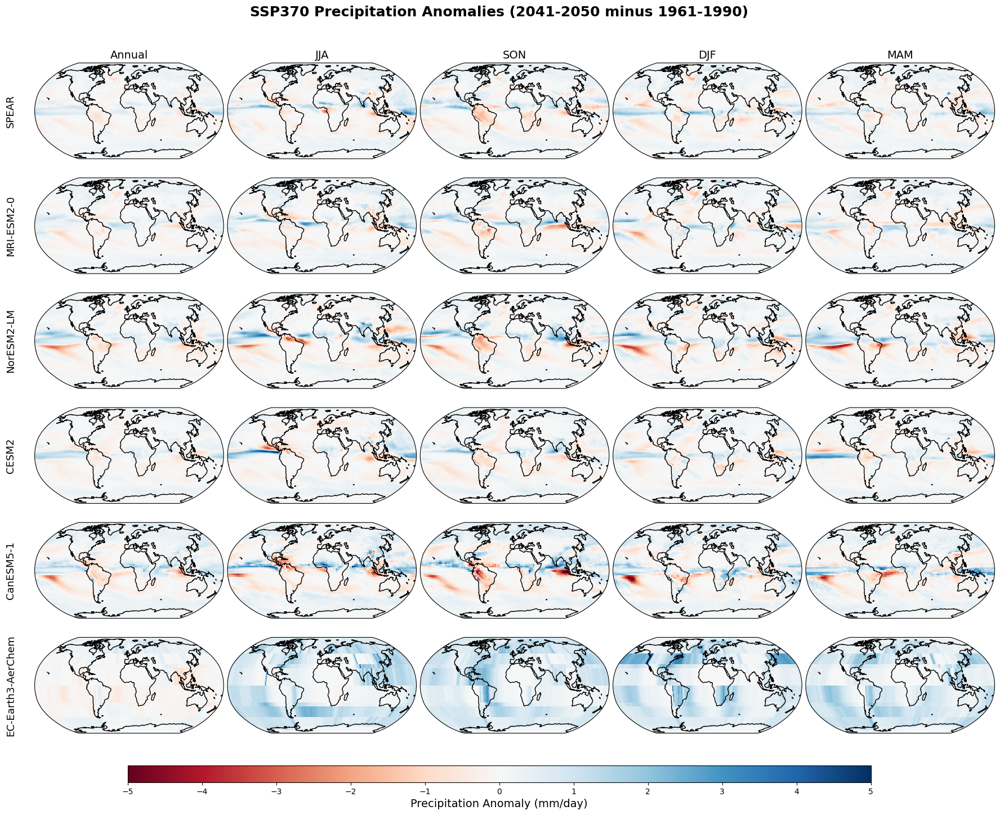

In [16]:
# Plotting
seasonal_anoms = {
    "SPEAR":            spear_ssp370_seasonal_anom,
    "MRI-ESM2-0":       mri_ssp370_seasonal_anom,
    "NorESM2-LM":       noresm2_ssp370_seasonal_anom,
    "CESM2":            cesm2_ssp370_seasonal_anom,
    "CanESM5-1":        canesm5_ssp370_seasonal_anom,
    "EC-Earth3-AerChem": ec_ssp370_seasonal_anom
}

annual_anoms = {
    "SPEAR":            spear_ssp370_anom,
    "MRI-ESM2-0":       mri_ssp370_anom,
    "NorESM2-LM":       noresm2_ssp370_anom,
    "CESM2":            cesm2_ssp370_anom,
    "CanESM5-1":        canesm5_ssp370_anom,
    "EC-Earth3-AerChem": ec_ssp370_anom
}

models  = list(seasonal_anoms.keys())
seasons = ["JJA", "SON", "DJF", "MAM"]
vmin = -5    
vmax = 5       
cbar_ticks = np.arange(-5, 6, 1) 

fig, axes = plt.subplots(
    nrows=len(models),
    ncols=len(seasons) + 1,
    figsize=(22, 15),
    subplot_kw={"projection": ccrs.Robinson()}
)

for i, model in enumerate(models):
    for j in range(len(seasons) + 1):

        ax = axes[i, j]
        ax.set_global()
        ax.coastlines()

        if j == 0:
            # Annual precipitation
            data = annual_anoms[model]
        else:
            # Seasonal columns
            season = seasons[j - 1]
            data = seasonal_anoms[model].sel(season=season)
        im = data.plot(
            ax=ax,
            transform=ccrs.PlateCarree(),
            cmap="RdBu",
            vmin=vmin, vmax=vmax,
            add_colorbar=False,
            add_labels=False
        )

        if i == 0:
            if j == 0:
                ax.set_title("Annual", fontsize=14)
            else:
                ax.set_title(seasons[j - 1], fontsize=14)

        if j == 0:
            ax.text(-0.10, 0.5, model, fontsize=13,
                    rotation=90, ha="right", va="center",
                    transform=ax.transAxes)


cbar_ax = fig.add_axes([0.20, 0.06, 0.60, 0.02])
cbar = fig.colorbar(im, cax=cbar_ax, orientation="horizontal")
cbar.set_label("Precipitation Anomaly (mm/day)", fontsize=14)
cbar.set_ticks(cbar_ticks)

fig.suptitle(
    "SSP370 Precipitation Anomalies (2041-2050 minus 1961-1990)",
    fontsize=18, fontweight="bold", y=0.98
)

fig.subplots_adjust(top=0.92, wspace=0.02, hspace=0.05)

# Decomposition of the effects of GHG & aerosol reduction from SSP370 to SSP126: SPEAR

In [17]:
# Loading in ssp126
spear_ssp126_pr = xr.open_zarr('/home/persad_research/SIMULATION_DATA/ZARR/RAMIP/SIM_VARIABLES/SPEAR_ssp126_day_pr.zarr')
spear_ssp126_pr = spear_ssp126_pr.sel(time=slice('2041-01-01', '2050-12-31'))
spear_ssp126_pr_mm_day = spear_ssp126_pr['pr'] * 86400
spear_ssp126_annual = spear_ssp126_pr_mm_day.mean('member').mean('time')
spear_ssp126_seasonal_member = season_mean(spear_ssp126_pr_mm_day)
spear_ssp126_seasonal = (spear_ssp126_seasonal_member.mean(dim ='member'))
spear_ssp126_seasonal = spear_ssp126_seasonal.compute()

In [18]:
spear_ssp126_seasonal_anom = spear_ssp126_seasonal - spear_historical_seasonal
spear_ssp126_annual_anom = spear_ssp126_annual - spear_historical_pr_mm_day

In [19]:
# Loading in ssp370-126aer
spear_ssp370_126aer = xr.open_zarr('/home/persad_research/SIMULATION_DATA/ZARR/RAMIP/SIM_VARIABLES/SPEAR_ssp370-126aer_day_pr.zarr')
spear_ssp370_126aer= spear_ssp370_126aer.sel(time=slice('2041-01-01', '2050-12-31'))
spear_ssp370_126aer_pr_mm_day = spear_ssp370_126aer['pr'] * 86400
spear_ssp370_126aer_annual = spear_ssp370_126aer_pr_mm_day.mean('time').mean('member')
spear_ssp370_126aer_seasonal_member = season_mean(spear_ssp370_126aer_pr_mm_day)
spear_ssp370_126aer_seasonal = (spear_ssp370_126aer_seasonal_member.mean(dim ='member'))
spear_ssp370_126aer_seasonal = spear_ssp370_126aer_seasonal.compute()

In [20]:
spear_ssp370_126aer_seasonal_anom = spear_ssp370_126aer_seasonal - spear_historical_seasonal
spear_ssp370_126aer_annual_anom = spear_ssp370_126aer_annual - spear_historical_pr_mm_day

In [ ]:
# Effect of aerosol reduction 
spear_aer_reduction = spear_ssp370_126aer_seasonal - spear_ssp370_seasonal
spear_aer_reduction_annual = spear_ssp370_126aer_annual - spear_ssp370_annual
# Effect of GHG reduction
spear_ghg_reduction = spear_ssp126_seasonal - spear_ssp370_126aer_seasonal
spear_ghg_reduction_annual = spear_ssp126_annual - spear_ssp370_126aer_annual

In [ ]:
# Variables I am plotting
#spear_ssp370_seasonal_anom (get the annual from above)
#spear_ssp126_seasonal_anom
#spear_ssp370_126aer_seasonal_anom 
#spear_aer_reduction
#spear_ghg_reduction

#add annual anomalies on the left hand side for each 

In [ ]:
def minmax(da):
    return float(da.min()), float(da.max())

variables = {
    "SSP370 Anomaly": spear_ssp370_seasonal_anom,
    "SSP126 Anomaly": spear_ssp126_seasonal_anom,
    "SSP370-126 Aer Anomaly": spear_ssp370_126aer_seasonal_anom,
    "Aerosol Reduction Effect": spear_aer_reduction,
    "GHG Reduction Effect": spear_ghg_reduction
}

for name, da in variables.items():
    mn, mx = minmax(da)
    print(f"{name:28s}  min={mn: .3f},  max={mx: .3f}")


SSP370 Anomaly                min=-4.324,  max= 4.015
SSP126 Anomaly                min=-3.989,  max= 3.731
SSP370-126 Aer Anomaly        min=-4.049,  max= 3.390
Aerosol Reduction Effect      min=-2.136,  max= 2.897
GHG Reduction Effect          min=-1.861,  max= 1.961


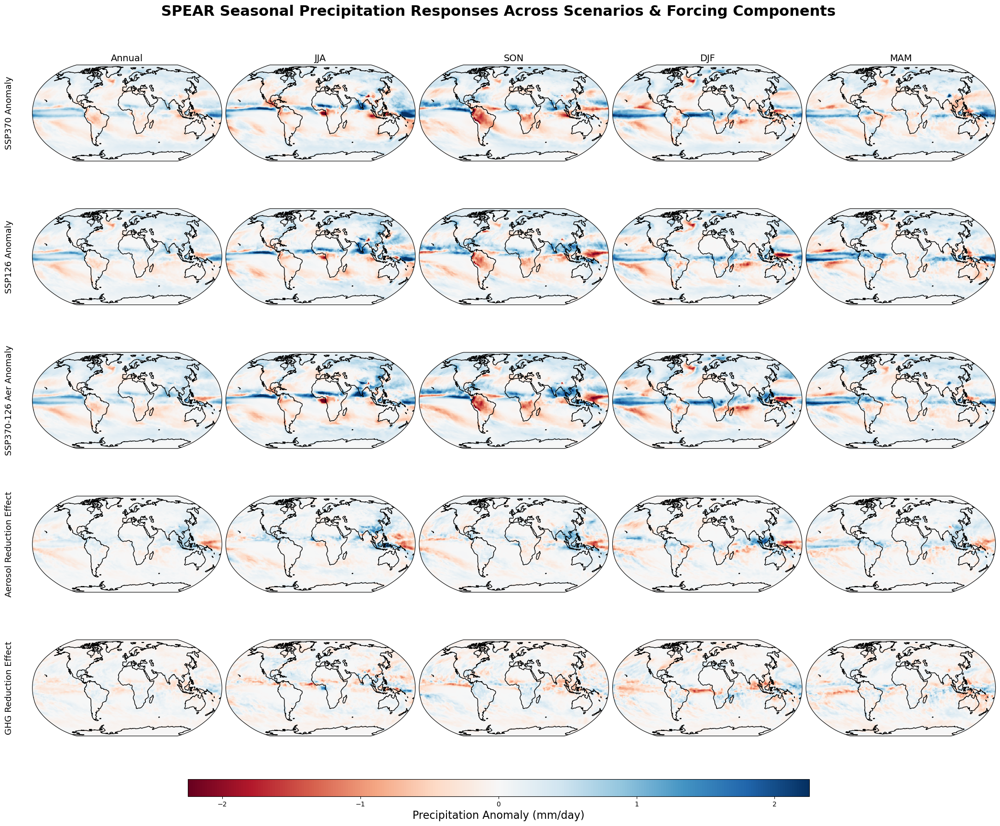

In [25]:
# Plotting SPEAR
variables = {
    "SSP370 Anomaly": spear_ssp370_seasonal_anom,
    "SSP126 Anomaly": spear_ssp126_seasonal_anom,
    "SSP370-126 Aer Anomaly": spear_ssp370_126aer_seasonal_anom,
    "Aerosol Reduction Effect": spear_aer_reduction,
    "GHG Reduction Effect": spear_ghg_reduction
}

annual_anoms = {
    "SSP370 Anomaly": spear_ssp370_anom,
    "SSP126 Anomaly": spear_ssp126_annual_anom,
    "SSP370-126 Aer Anomaly": spear_ssp370_126aer_annual_anom,
    "Aerosol Reduction Effect": spear_aer_reduction_annual,
    "GHG Reduction Effect": spear_ghg_reduction_annual,
}

var_list = list(variables.keys())
seasons = ["JJA", "SON", "DJF", "MAM"]
col_labels = ["Annual"] + seasons

vmin, vmax = -2.25, 2.25
cbar_ticks = np.arange(-2, 3, 1)
cmap = "RdBu"

fig, axes = plt.subplots(
    nrows=len(var_list),
    ncols=len(col_labels),             
    figsize=(26, 18),
    subplot_kw={"projection": ccrs.Robinson()}
)

for i, var_name in enumerate(var_list):
    for j, col in enumerate(col_labels):

        ax = axes[i, j]
        ax.set_global()
        ax.coastlines()

        if col == "Annual":
            data = annual_anoms[var_name]
        else:
            data = variables[var_name].sel(season=col)

        im = data.plot(
            ax=ax,
            transform=ccrs.PlateCarree(),
            cmap=cmap,
            vmin=vmin, vmax=vmax,
            add_colorbar=False,
            add_labels=False
        )

        # Column titles on top row
        if i == 0:
            ax.set_title(col, fontsize=14)

        # Row label on left-most column
        if j == 0:
            ax.text(
                -0.10, 0.5, var_name, fontsize=13, 
                rotation=90, ha="right", va="center",
                transform=ax.transAxes
            )

# Colorbar
cbar_ax = fig.add_axes([0.25, 0.06, 0.50, 0.02])
cbar = fig.colorbar(im, cax=cbar_ax, orientation="horizontal")
cbar.set_label("Precipitation Anomaly (mm/day)", fontsize=16)
cbar.set_ticks(cbar_ticks)

fig.suptitle(
    "SPEAR Seasonal Precipitation Responses Across Scenarios & Forcing Components",
    fontsize=22, fontweight="bold", y=0.98
)

fig.subplots_adjust(top=0.93, wspace=0.02, hspace=0.10)
plt.show()


# Decomposition of the effects of GHG & aerosol reduction from SSP370 to SSP126: MRI-ESM2-0

In [26]:
# loading in ssp126 data for MRI-ESM2-0
mri_ssp126_pr = xr.open_zarr('/home/persad_research/SIMULATION_DATA/ZARR/RAMIP/SIM_VARIABLES/MRI-ESM2-0_ssp126_day_pr.zarr')
mri_ssp126_pr = mri_ssp126_pr.sel(time=slice('2041-01-01', '2050-12-31'))
mri_ssp126_pr_mm_day = mri_ssp126_pr['pr'] * 86400
mri_ssp126_annual = mri_ssp126_pr_mm_day.mean('member').mean('time')
mri_ssp126_seasonal_member = season_mean(mri_ssp126_pr_mm_day)
mri_ssp126_seasonal = (mri_ssp126_seasonal_member.mean(dim ='member'))
mri_ssp126_seasonal = mri_ssp126_seasonal.compute() 

In [ ]:
mri_ssp126_seasonal_anom = mri_ssp126_seasonal - mri_historical_seasonal
mri_ssp126_annual_anom = mri_ssp126_annual - mri_historical_pr_mm_day  

In [28]:
# loading in ssp370-126aer data for MRI-ESM2-0
mri_ssp370_126aer = xr.open_zarr('/home/persad_research/SIMULATION_DATA/ZARR/RAMIP/SIM_VARIABLES/MRI-ESM2-0_ssp370-126aer_day_pr.zarr')
mri_ssp370_126aer= mri_ssp370_126aer.sel(time=slice('2041-01-01', '2050-12-31'))
mri_ssp370_126aer_pr_mm_day = mri_ssp370_126aer['pr'] * 86400
mri_ssp370_126aer_annual = mri_ssp370_126aer_pr_mm_day.mean('time').mean('member')
mri_ssp370_126aer_seasonal_member = season_mean(mri_ssp370_126aer_pr_mm_day)
mri_ssp370_126aer_seasonal = (mri_ssp370_126aer_seasonal_member.mean(dim ='member'))
mri_ssp370_126aer_seasonal = mri_ssp370_126aer_seasonal.compute()

In [29]:
mri_ssp370_126aer_seasonal_anom = mri_ssp370_126aer_seasonal - mri_historical_seasonal
mri_ssp370_126aer_annual_anom = mri_ssp370_126aer_annual - mri_historical_pr_mm_day

In [30]:
# Effect of aerosol reduction
mri_aer_reduction = mri_ssp370_126aer_seasonal - mri_ssp370_seasonal
mri_aer_reduction_annual = mri_ssp370_126aer_annual - mri_ssp370_annual
# Effect of GHG reduction
mri_ghg_reduction = mri_ssp126_seasonal - mri_ssp370_126aer_seasonal
mri_ghg_reduction_annual = mri_ssp126_annual - mri_ssp370_126aer_annual

In [31]:
# Variables I am plotting for both seasonal and annual
#mri_ssp370_seasonal_anom 
#mri_ssp126_seasonal_anom
#mri_ssp370_126aer_seasonal_anom 
#mri_aer_reduction
#mri_ghg_reduction  

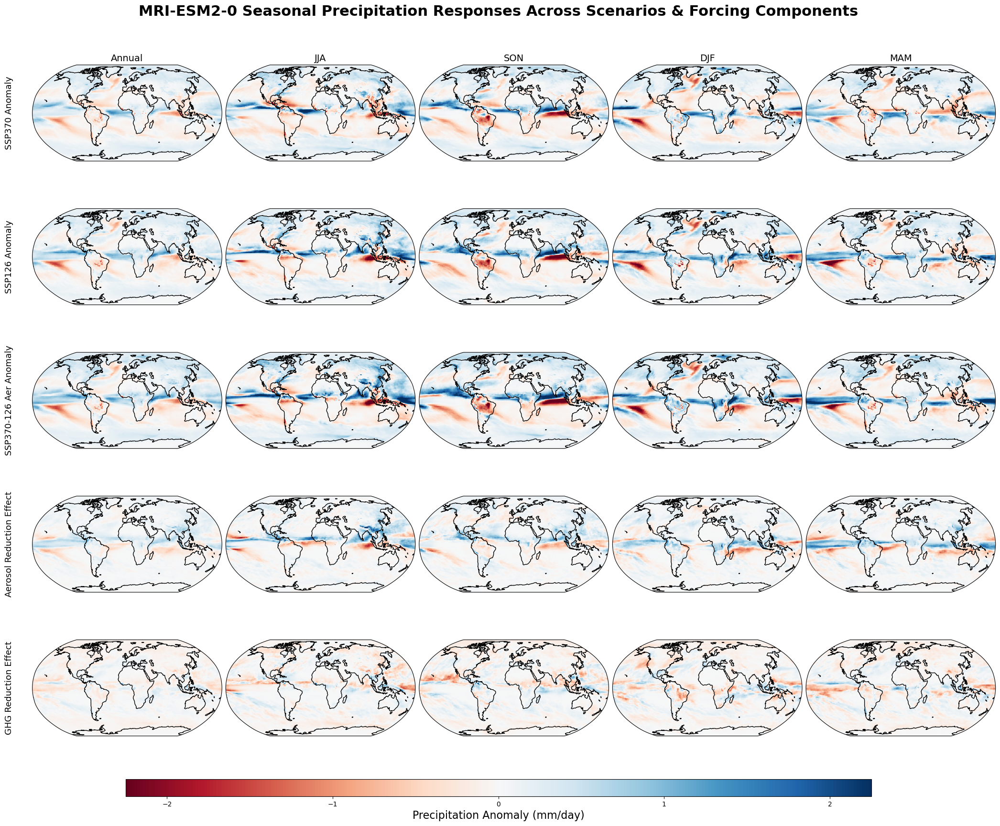

In [41]:
# Plotting MRI-ESM2-0
variables = {
    "SSP370 Anomaly": mri_ssp370_seasonal_anom,
    "SSP126 Anomaly": mri_ssp126_seasonal_anom,
    "SSP370-126 Aer Anomaly": mri_ssp370_126aer_seasonal_anom,
    "Aerosol Reduction Effect": mri_aer_reduction,
    "GHG Reduction Effect": mri_ghg_reduction
}
annual_anoms = {
    "SSP370 Anomaly": mri_ssp370_anom,
    "SSP126 Anomaly": mri_ssp126_annual_anom,
    "SSP370-126 Aer Anomaly": mri_ssp370_126aer_annual_anom,
    "Aerosol Reduction Effect": mri_aer_reduction_annual,
    "GHG Reduction Effect": mri_ghg_reduction_annual,
}
var_list = list(variables.keys())
seasons = ["JJA", "SON", "DJF", "MAM"]
col_labels = ["Annual"] + seasons       
vmin, vmax = -2.25, 2.25
cbar_ticks = np.arange(-2, 3, 1)
cmap = "RdBu" 

fig, axes = plt.subplots(
    nrows=len(var_list), 
    ncols=len(col_labels),             
    figsize=(26, 18),
    subplot_kw={"projection": ccrs.Robinson()}
)   
for i, var_name in enumerate(var_list):
    for j, col in enumerate(col_labels):

        ax = axes[i, j]
        ax.set_global()
        ax.coastlines()

        if col == "Annual":
            data = annual_anoms[var_name]
        else:
            data = variables[var_name].sel(season=col)

        im = data.plot(
            ax=ax,
            transform=ccrs.PlateCarree(),
            cmap=cmap,
            vmin=vmin, vmax=vmax,
            add_colorbar=False,
            add_labels=False
        )

        # Column titles on top row
        if i == 0:
            ax.set_title(col, fontsize=14)

        # Row label on left-most column
        if j == 0:
            ax.text(
                -0.10, 0.5, var_name, fontsize=13, 
                rotation=90, ha="right", va="center",
                transform=ax.transAxes
            )
# Colorbar
cbar_ax = fig.add_axes([0.2, 0.06, 0.60, 0.02])
cbar = fig.colorbar(im, cax=cbar_ax, orientation="horizontal")
cbar.set_label("Precipitation Anomaly (mm/day)", fontsize=16)
cbar.set_ticks(cbar_ticks) 
fig.suptitle(
    "MRI-ESM2-0 Seasonal Precipitation Responses Across Scenarios & Forcing Components",
    fontsize=22, fontweight="bold", y=0.98
)  
fig.subplots_adjust(top=0.93, wspace=0.02, hspace=0.10)
plt.show()

# Decomposition of the effects of GHG & aerosol reduction from SSP370 to SSP126: NorESM2-LM

In [33]:
# loading in data for NorESM2-LM
noresm2_ssp126_pr = xr.open_zarr('/home/persad_research/SIMULATION_DATA/ZARR/RAMIP/SIM_VARIABLES/NorESM2-LM_ssp126_day_pr.zarr')
noresm2_ssp126_pr = noresm2_ssp126_pr.sel(time=slice('2041-01-01', '2050-12-31'))
noresm2_ssp126_pr_mm_day = noresm2_ssp126_pr['pr'] * 86400
noresm2_ssp126_annual = noresm2_ssp126_pr_mm_day.mean('member').mean('time')
noresm2_ssp126_seasonal_member = season_mean(noresm2_ssp126_pr_mm_day)
noresm2_ssp126_seasonal = (noresm2_ssp126_seasonal_member.mean(dim ='member'))
noresm2_ssp126_seasonal = noresm2_ssp126_seasonal.compute()

In [34]:
noresm2_ssp126_seasonal_anom = noresm2_ssp126_seasonal - noresm2_historical_seasonal
noresm2_ssp126_annual_anom = noresm2_ssp126_annual - noresm2_historical_pr_mm_day

In [35]:
# loading in ssp370-126aer data for NorESM2-LM
noresm2_ssp370_126aer = xr.open_zarr('/home/persad_research/SIMULATION_DATA/ZARR/RAMIP/SIM_VARIABLES/NorESM2-LM_ssp370-126aer_day_pr.zarr')
noresm2_ssp370_126aer= noresm2_ssp370_126aer.sel(time=slice('2041-01-01', '2050-12-31'))
noresm2_ssp370_126aer_pr_mm_day = noresm2_ssp370_126aer['pr'] * 86400
noresm2_ssp370_126aer_annual = noresm2_ssp370_126aer_pr_mm_day.mean('time').mean('member')
noresm2_ssp370_126aer_seasonal_member = season_mean(noresm2_ssp370_126aer_pr_mm_day)
noresm2_ssp370_126aer_seasonal = (noresm2_ssp370_126aer_seasonal_member.mean(dim ='member'))
noresm2_ssp370_126aer_seasonal = noresm2_ssp370_126aer_seasonal.compute()

In [36]:
noresm2_ssp370_126aer_seasonal_anom = noresm2_ssp370_126aer_seasonal - noresm2_historical_seasonal
noresm2_ssp370_126aer_annual_anom = noresm2_ssp370_126aer_annual - noresm2_historical_pr_mm_day

In [37]:
# Effect of aerosol reduction
noresm2_aer_reduction = noresm2_ssp370_126aer_seasonal - noresm2_ssp370_seasonal
noresm2_aer_reduction_annual = noresm2_ssp370_126aer_annual - noresm2_ssp370_annual
# Effect of GHG reduction
noresm2_ghg_reduction = noresm2_ssp126_seasonal - noresm2_ssp370_126aer_seasonal
noresm2_ghg_reduction_annual = noresm2_ssp126_annual - noresm2_ssp370_126aer_annual

In [ ]:
# Variables I am plotting
#noresm_ssp370_seasonal_anom (get the annual from above)
#noresm_ssp126_seasonal_anom
#noresm_ssp370_126aer_seasonal_anom 
#noresm_aer_reduction
#noresm_ghg_reduction

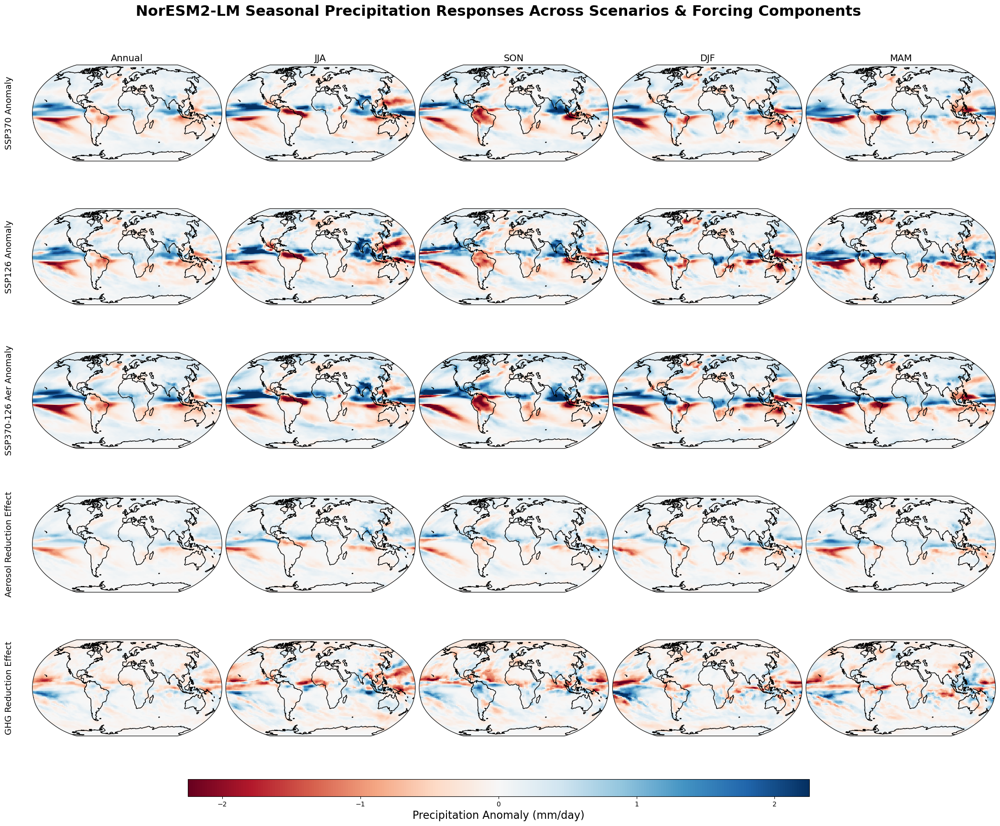

In [43]:
# Plotting NorESM2-LM
variables = {
    "SSP370 Anomaly": noresm2_ssp370_seasonal_anom,
    "SSP126 Anomaly": noresm2_ssp126_seasonal_anom,
    "SSP370-126 Aer Anomaly": noresm2_ssp370_126aer_seasonal_anom,
    "Aerosol Reduction Effect": noresm2_aer_reduction,
    "GHG Reduction Effect": noresm2_ghg_reduction
}
annual_anoms = {
    "SSP370 Anomaly": noresm2_ssp370_anom,
    "SSP126 Anomaly": noresm2_ssp126_annual_anom,
    "SSP370-126 Aer Anomaly": noresm2_ssp370_126aer_annual_anom,
    "Aerosol Reduction Effect": noresm2_aer_reduction_annual,
    "GHG Reduction Effect": noresm2_ghg_reduction_annual,
}
var_list = list(variables.keys())
seasons = ["JJA", "SON", "DJF", "MAM"]
col_labels = ["Annual"] + seasons      
vmin, vmax = -2.25, 2.25
cbar_ticks = np.arange(-2, 3, 1)
cmap = "RdBu"  
fig, axes = plt.subplots(
    nrows=len(var_list), 
    ncols=len(col_labels),             
    figsize=(26, 18),
    subplot_kw={"projection": ccrs.Robinson()}
)   
for i, var_name in enumerate(var_list):
    for j, col in enumerate(col_labels):

        ax = axes[i, j]
        ax.set_global()
        ax.coastlines()

        if col == "Annual":
            data = annual_anoms[var_name]
        else:
            data = variables[var_name].sel(season=col)

        im = data.plot(
            ax=ax,
            transform=ccrs.PlateCarree(),
            cmap=cmap,
            vmin=vmin, vmax=vmax,
            add_colorbar=False,
            add_labels=False
        )

        # Column titles on top row
        if i == 0:
            ax.set_title(col, fontsize=14)

        # Row label on left-most column
        if j == 0:
            ax.text(
                -0.10, 0.5, var_name, fontsize=13, 
                rotation=90, ha="right", va="center",
                transform=ax.transAxes
            )
# Colorbar
cbar_ax = fig.add_axes([0.25, 0.06, 0.50, 0.02])
cbar = fig.colorbar(im, cax=cbar_ax, orientation="horizontal")
cbar.set_label("Precipitation Anomaly (mm/day)", fontsize=16)
cbar.set_ticks(cbar_ticks) 
fig.suptitle(
    "NorESM2-LM Seasonal Precipitation Responses Across Scenarios & Forcing Components",
    fontsize=22, fontweight="bold", y=0.98
)  
fig.subplots_adjust(top=0.93, wspace=0.02, hspace=0.10)
plt.show()